# Image and Bounding Boxes Augmentation

## Description
Image augmentation for machine learning experiments.
Based on [aleju/imgaug](https://github.com/aleju/imgaug) and implemetation of [asetkn](https://github.com/asetkn/Tutorial-Image-and-Multiple-Bounding-Boxes-Augmentation-for-Deep-Learning-in-4-Steps).
This notebook will create augmented images and its bounding box in csv format.

## Requirements
### In folder images/
1. **Images** with .jpg extension (you could change it in CONSTANTS)
2. **Annotation** files **.xml**. PASCAL VOC format XML files with coordinates of bounding boxes for objects we want to detect
3. **class_names.txt** contains class names corresponding to your annotation

## Notes
- You can change some settings in CONSTANTS bellow.
- All result images will be placed in **output/** directory
- The annotations reasult will be placed in root directory with name as declared on **ALL_LABEL_CSV_NAME**
- Set **SHOW_AUG_RESULT** = **True** will show you all the augmented images with its bounding box
- Change **AUG_COUNT** according to your desired number of images generated per image

In [1]:
## CONSTANTS
AUG_PREFIX = 'myaug'
AUG_COUNT = 2
LABEL_CSV_NAME = 'my-labels.csv'
ALL_LABEL_CSV_NAME = 'my-all-labels.csv'
EXT = '.jpg'
CLASS_NAMES_TXT = 'images/class_names.txt'
IMG_SIZE = 600
SHOW_AUG_RESULT = True
CLEAR_OUTPUT_DIR = True

In [2]:
# we will import all required libraries for this tutorial in advance

import imgaug as ia
ia.seed(1)
# imgaug uses matplotlib backend for displaying images
%matplotlib inline
from imgaug.augmentables.bbs import BoundingBox, BoundingBoxesOnImage
from imgaug import augmenters as iaa 
# imageio library will be used for image input/output
import imageio
import pandas as pd
import numpy as np
import re
import os
import glob
# this library is needed to read XML files for converting it into CSV
import xml.etree.ElementTree as ET
import shutil

## The data: images, XML files, bounding boxes

Let's have a look at data we have. You can see basic operations of imgaug library for image loading and augmentation in this [notebook](https://nbviewer.jupyter.org/github/aleju/imgaug-doc/blob/master/notebooks/A01%20-%20Load%20and%20Augment%20an%20Image.ipynb).

In [3]:
# load images as NumPy arrays and append them to images list
images = []
for index, file in enumerate(glob.glob('images/*'+EXT)):
    images.append(imageio.imread(file))
    
# how many images we have
print('We have {} images'.format(len(images)))

We have 10 images


## 1. Convert all XML files into one CSV file that we can feed into TensorFlow Object Detection API

To convert all separate PASCAL VOC format XML files into one CSV file we will use the [xml_to_csv.py](https://github.com/datitran/raccoon_dataset/blob/master/xml_to_csv.py) code developed by Dan Tran.

In [4]:
# Function that will extract column data for our CSV file
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     int(root.find('size')[0].text),
                     int(root.find('size')[1].text),
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [5]:
# apply xml_to_csv() function to convert all XML files in images/ folder into labels.csv
labels_df = xml_to_csv('images/')
labels_df.to_csv((LABEL_CSV_NAME), index=None)
print('Successfully converted xml to csv.')

Successfully converted xml to csv.


## 2. Resize all images together with the corresponding object bounding boxes

TensorFlow Object Detection API can be fed by images of different sizes. But your GPU might not be able to handle big pictures. Let's say we want to resize all the picture so the width and height should be 600px or less. 

To get familiar with basics of image and multiple bounding boxes augmentation refer to this [tutorial](https://nbviewer.jupyter.org/github/aleju/imgaug-doc/blob/master/notebooks/B02%20-%20Augment%20Bounding%20Boxes.ipynb) from imgaug creators.

We will create resize_imgaug() function that will take DataFrame as shown in the previous cell and apply resizing augmentation to the image and all corresponding bounding boxes. The function will return DataFrame with updated images and bounding boxes annotations.

First, we visualize some of the operation that will take place in the resize_imgaug() function.

In [6]:
# start by groupping each image bounding boxes coordinates
# separate dataframes are formed based on the filename
grouped = labels_df.groupby('filename')

In [7]:
# to resize the images we create two augmenters
# one is used when the image height is more than 600px and the other when the width is more than 600px
height_resize = iaa.Sequential([ 
    iaa.Resize({"height": IMG_SIZE, "width": 'keep-aspect-ratio'})
])

width_resize = iaa.Sequential([ 
    iaa.Resize({"height": 'keep-aspect-ratio', "width": IMG_SIZE})
])

When we augment images using imgaug library it resizes the bounding boxes as well and return BoundingBoxesOnImage object.
It looks like this: 
```
['filename.jpg',
 BoundingBoxesOnImage([BoundingBox(x1=81.1250, y1=114.5000, x2=324.8750, y2=320.7500, label=None)], shape=(337, 600, 3))]
```
bbs_obj_to_df() function will convert BoundingBoxesOnImage object to data frame with xmin, ymin, xmax, ymax columns.

In [8]:
# function to convert BoundingBoxesOnImage object into DataFrame
def bbs_obj_to_df(bbs_object):
#     convert BoundingBoxesOnImage object into array
    bbs_array = bbs_object.to_xyxy_array()
#     convert array into a DataFrame ['xmin', 'ymin', 'xmax', 'ymax'] columns
    df_bbs = pd.DataFrame(bbs_array, columns=['xmin', 'ymin', 'xmax', 'ymax'])
    return df_bbs

Next, define resize_imgaug() function. 

It will take pandas DataFrame with ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax'] columns. 

And apply resizing augmentation to the image and all corresponding bounding boxes. 

The function will return DataFrame with updated images and bounding boxes annotations.
resize_imgaug() function takes the following variables:
- df: pandas DataFrame with ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax'] columns, labels_df in our case
- images_path: path to the folder with original images, 'images/' in our case(don't forget the forward slash)
- aug_images_path: path to the folder where augmented images will be stored, e.g. 'aug_images/' (the folder should be created in advance)
- image_prefix:  prefix for augmented image filenames, e.g 'aug_'

In [9]:
def resize_imgaug(df, images_path, aug_images_path, image_prefix):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')    
    
    for filename in df['filename'].unique():
    #   Get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)
        
    #   The only difference between if and elif statements below is the use of height_resize and width_resize augmentors
    #   deffined previously.

    #   If image height is greater than or equal to image width 
    #   AND greater than 600px perform resizing augmentation shrinking image height to 600px.
        if group_df['height'].unique()[0] >= group_df['width'].unique()[0] and group_df['height'].unique()[0] > IMG_SIZE:
        #   read the image
            image = imageio.imread(images_path+filename)
        #   get bounding boxes coordinates and write into array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        #   pass the array of bounding boxes coordinates to the imgaug library
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        #   apply augmentation on image and on the bounding boxes
            image_aug, bbs_aug = height_resize(image=image, bounding_boxes=bbs)
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])
            
    #   if image width is greater than image height 
    #   AND greater than 600px perform resizing augmentation shrinking image width to 600px
        elif group_df['width'].unique()[0] > group_df['height'].unique()[0] and group_df['width'].unique()[0] > IMG_SIZE:
        #   read the image
            image = imageio.imread(images_path+filename)
        #   get bounding boxes coordinates and write into array        
            bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        #   pass the array of bounding boxes coordinates to the imgaug library
            bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
        #   apply augmentation on image and on the bounding boxes
            image_aug, bbs_aug = width_resize(image=image, bounding_boxes=bbs)
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)        
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])

    #     append image info without any changes if it's height and width are both less than 600px 
        else:
            aug_bbs_xy = pd.concat([aug_bbs_xy, group_df])
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

In [10]:
if(CLEAR_OUTPUT_DIR):
    # if true delete all files in output & aug_images first
    for f in os.listdir('output'):
        os.remove(os.path.join('output', f))
    for f in os.listdir('aug_images'):
        os.remove(os.path.join('aug_images', f))

In [11]:
# copy files from images/ to output/ because it is going to use for augmentation
for file in glob.glob('images/*'):
    shutil.copy('images/'+file[7:], 'output/'+file[7:])

In [12]:
# apply resizing augmentation to our images and write the updated images and bounding boxes annotations to the DataFrame 
# we will not apply prefix to our files and will overwrite images in the same directory
resized_images_df = resize_imgaug(labels_df, 'images/', 'output/', '')

In [13]:
# overwrite the labels.csv with updated info
resized_images_df.to_csv(LABEL_CSV_NAME, index=False)

## 3. Augment images to upsample our dataset. Corresponding object bounding boxes should be augmented accordingly

In this part we will learn how to perform image augmetations. To do so we slightly change our resize_imgaug() function. But first, let's assign augmentation we want to perfom.

imgaug allows us to tune many cool parameters which you can read about in their [Documentation](https://imgaug.readthedocs.io/en/latest/source/augmenters.html).

In [14]:
# This setup of augmentation parameters will pick two of four given augmenters and apply them in random order
aug = iaa.SomeOf(2, [    
    iaa.Affine(scale=(0.5, 1.5)),
    iaa.Affine(rotate=(-60, 60)),
    iaa.Affine(translate_percent={"x": (-0.3, 0.3), "y": (-0.3, 0.3)}),
    iaa.Fliplr(1),
    iaa.Multiply((0.5, 1.5)),
    iaa.GaussianBlur(sigma=(1.0, 3.0)),
    iaa.AdditiveGaussianNoise(scale=(0.03*255, 0.05*255))
])

Let's code image_aug() function.

It takes the same variables as resize_imgaug(), plus:
-augmenter: augmentation parameters of imgaug library. We can now apply custom augmenters.

image_aug() function is very similar to resize_imgaug().

But there's a caveat.

Augmentations, like zooming in and translating the image in x/y directions, can lead to objects of interest (e'g', red pandas) partially or completely move out of image pane. 

image_aug() function will clip the bounding box if the object of interest is partially outside of image pane. And it will ignore image altogether if no bounding boxes left in image pane.

In [15]:
def image_aug(df, images_path, aug_images_path, image_prefix, augmentor):
    # create data frame which we're going to populate with augmented image info
    aug_bbs_xy = pd.DataFrame(columns=
                              ['filename','width','height','class', 'xmin', 'ymin', 'xmax', 'ymax']
                             )
    grouped = df.groupby('filename')
    
    for filename in df['filename'].unique():
    #   get separate data frame grouped by file name
        group_df = grouped.get_group(filename)
        group_df = group_df.reset_index()
        group_df = group_df.drop(['index'], axis=1)   
    #   read the image
        image = imageio.imread(images_path+filename)
    #   get bounding boxes coordinates and write into array        
        bb_array = group_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
    #   pass the array of bounding boxes coordinates to the imgaug library
        bbs = BoundingBoxesOnImage.from_xyxy_array(bb_array, shape=image.shape)
    #   apply augmentation on image and on the bounding boxes
        image_aug, bbs_aug = augmentor(image=image, bounding_boxes=bbs)
    #   disregard bounding boxes which have fallen out of image pane    
        bbs_aug = bbs_aug.remove_out_of_image()
    #   clip bounding boxes which are partially outside of image pane
        bbs_aug = bbs_aug.clip_out_of_image()
        
    #   don't perform any actions with the image if there are no bounding boxes left in it    
        if re.findall('Image...', str(bbs_aug)) == ['Image([]']:
            pass
        
    #   otherwise continue
        else:
        #   write augmented image to a file
            imageio.imwrite(aug_images_path+image_prefix+filename, image_aug)  
        #   create a data frame with augmented values of image width and height
            info_df = group_df.drop(['xmin', 'ymin', 'xmax', 'ymax'], axis=1)    
            for index, _ in info_df.iterrows():
                info_df.at[index, 'width'] = image_aug.shape[1]
                info_df.at[index, 'height'] = image_aug.shape[0]
        #   rename filenames by adding the predifined prefix
            info_df['filename'] = info_df['filename'].apply(lambda x: image_prefix+x)
        #   create a data frame with augmented bounding boxes coordinates using the function we created earlier
            bbs_df = bbs_obj_to_df(bbs_aug)
        #   concat all new augmented info into new data frame
            aug_df = pd.concat([info_df, bbs_df], axis=1)
        #   append rows to aug_bbs_xy data frame
            aug_bbs_xy = pd.concat([aug_bbs_xy, aug_df])            
    
    # return dataframe with updated images and bounding boxes annotations 
    aug_bbs_xy = aug_bbs_xy.reset_index()
    aug_bbs_xy = aug_bbs_xy.drop(['index'], axis=1)
    return aug_bbs_xy

Here using techniques described above to compare original resized images and augmented copies. We will draw bounding boxes as well to make sure they were augmented correctly.

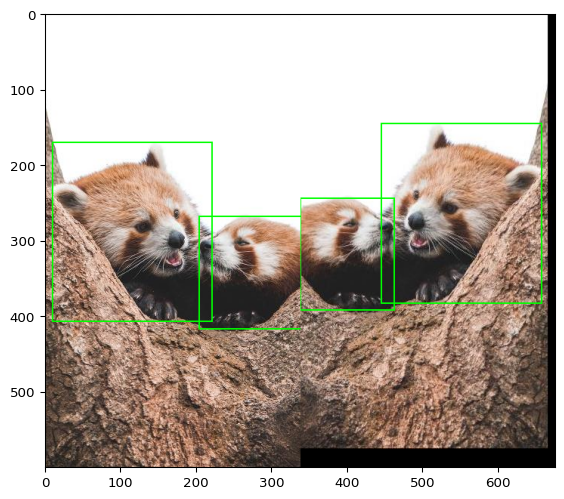

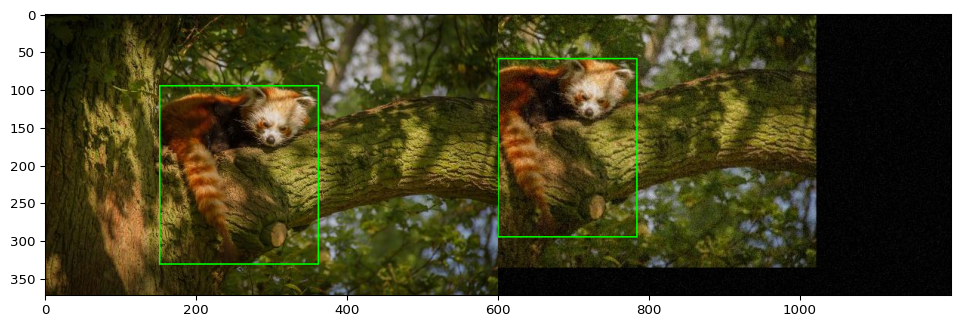

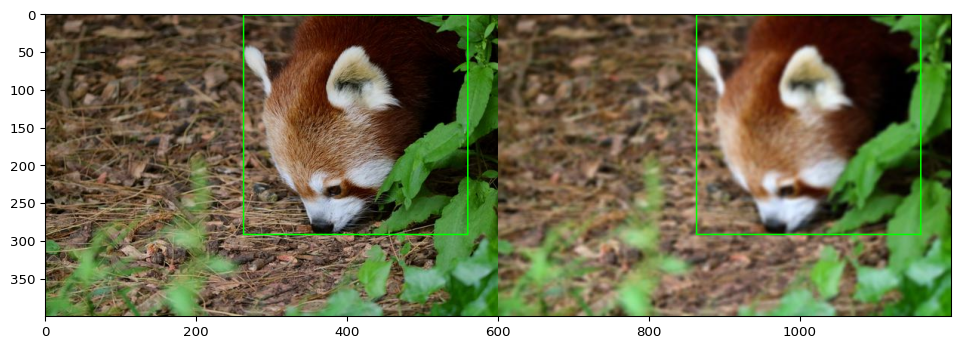

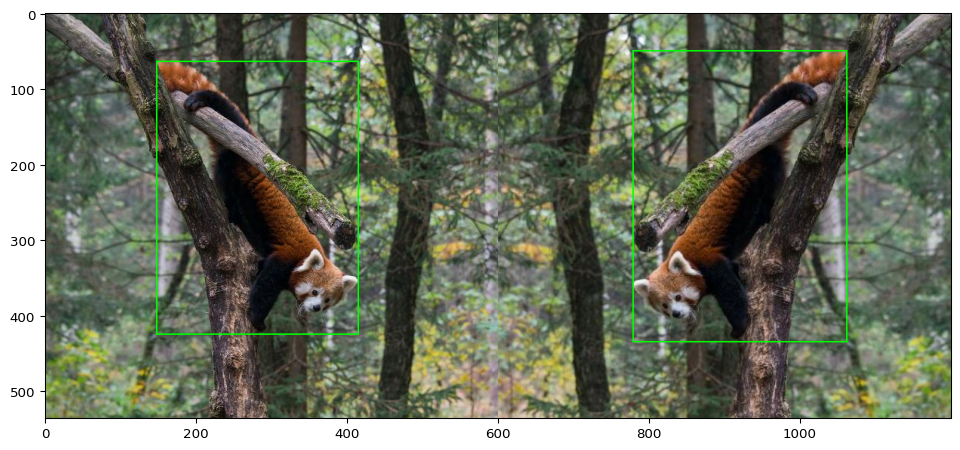

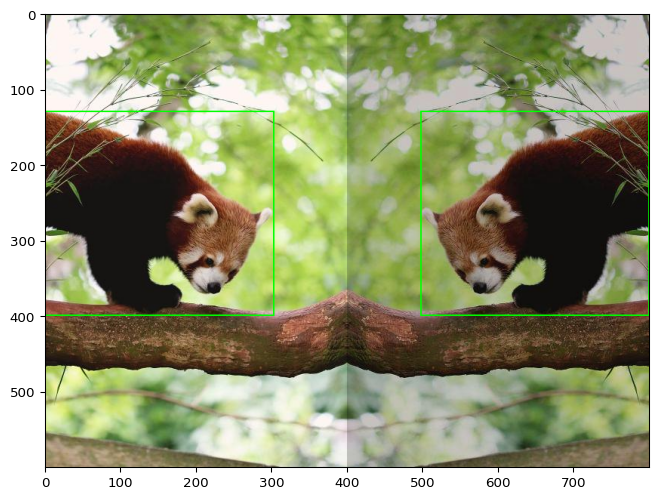

...

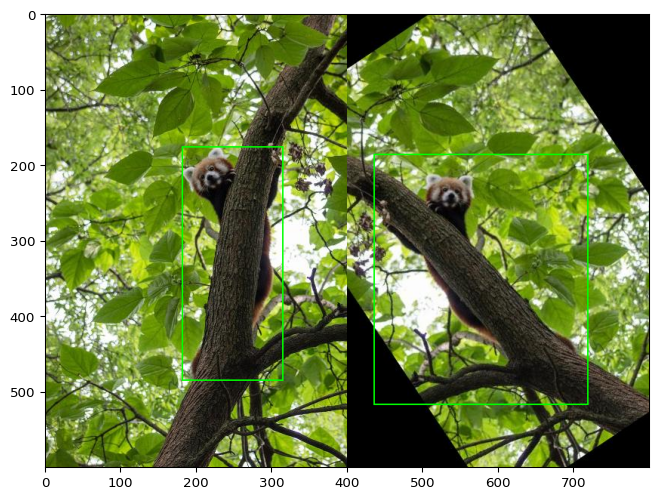

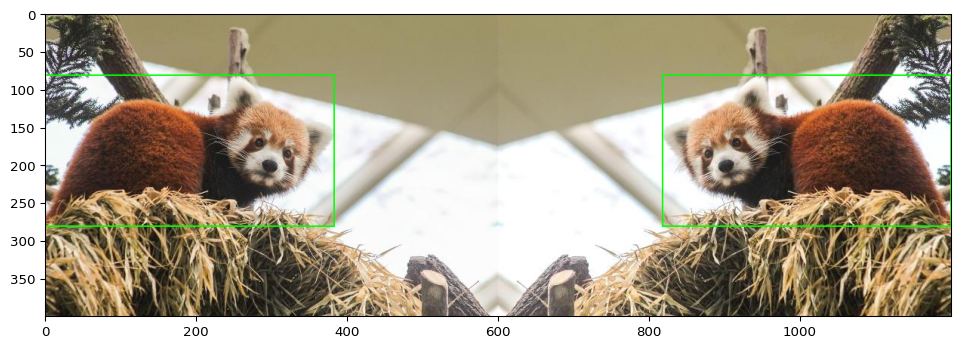

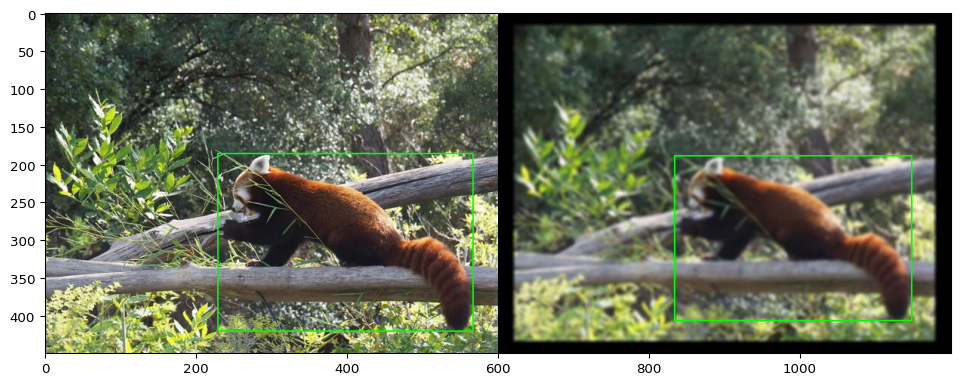

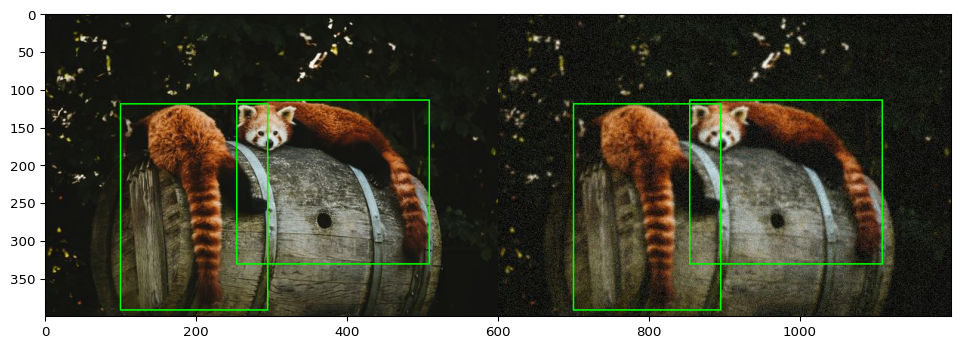

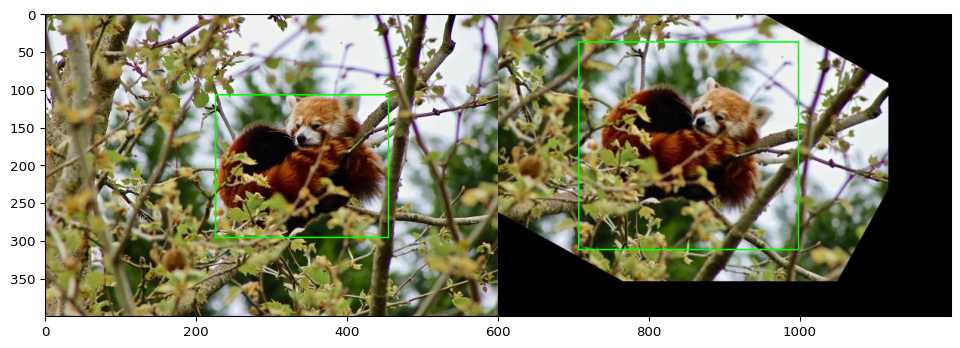

In [16]:
grouped_resized = resized_images_df.groupby('filename')
# Apply augmentation to our images and save files into 'aug_images/' folder with 'aug1_' prefix.
# Write the updated images and bounding boxes annotations to the augmented_images_df dataframe.
augmented_images_dfs = [0]*AUG_COUNT
for i in range(AUG_COUNT):
    aug_prefix = AUG_PREFIX+str(i)+'_'
    augmented_images_df = image_aug(resized_images_df, 'output/', 'aug_images/', aug_prefix, aug)
    augmented_images_dfs[i] = augmented_images_df
    grouped_augmented = augmented_images_df.groupby('filename')

    for filename in resized_images_df['filename'].unique():

        group_r_df = grouped_resized.get_group(filename)
        group_r_df = group_r_df.reset_index()
        group_r_df = group_r_df.drop(['index'], axis=1)
        bb_r_array = group_r_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        resized_img = imageio.imread('output/'+filename)
        bbs_r = BoundingBoxesOnImage.from_xyxy_array(bb_r_array, shape=resized_img.shape)

        group_a_df = grouped_augmented.get_group(aug_prefix+filename)
        group_a_df = group_a_df.reset_index()
        group_a_df = group_a_df.drop(['index'], axis=1)
        bb_a_array = group_a_df.drop(['filename', 'width', 'height', 'class'], axis=1).values
        augmented_img = imageio.imread('aug_images/'+aug_prefix+filename)
        bbs_a = BoundingBoxesOnImage.from_xyxy_array(bb_a_array, shape=augmented_img.shape)

        if(SHOW_AUG_RESULT):
            ia.imshow(np.hstack([
                    bbs_r.draw_on_image(resized_img, size=2),
                    bbs_a.draw_on_image(augmented_img, size=2)
                    ]))

## 4. Document augmented images' new sizes and bounding boxes' coordinates to a CSV file

We have two pandas DataFrames: 
1. resized_images_df - original resized images annotations
2. augmented_images_df - augmented images annotations

Let's concat them together and save in a new all_labels.csv file. After that we can put all the images in one folder.

In [17]:
augmented_images_dfs
all_labels_df_array = [0 for i in range(AUG_COUNT+1)]
i = 0
all_labels_df_array[i] = resized_images_df
for augs in augmented_images_dfs:
    i = i+1
    all_labels_df_array[i] = augs

In [18]:
# Concat resized_images_df and augmented_images_df together and save in a new all_labels.csv file
# all_labels_df = pd.concat([resized_images_df, augmented_images_df])
all_labels_df = pd.concat(all_labels_df_array)
all_labels_df.to_csv(ALL_LABEL_CSV_NAME, index=False)

In [19]:
# Lastly we can copy all our augmented images in the same folder as original resized images
for file in os.listdir('aug_images'):
    shutil.copy('aug_images/'+file, 'output/'+file)

# (Optional) Create .txt for YOLOv5 annotations
It's not really working properly in multiple bounding box

In [20]:
class_names = []
with open(CLASS_NAMES_TXT) as class_name:
    for line in class_name:
        class_names.append(line.rstrip('\n'))

# print(type(all_labels_df))
for index, item in all_labels_df.iterrows():
    # print(item)
    # write file annotation for yolo
    f = open("output/"+item["filename"].rstrip(EXT)+".txt", "w")
    class_index = class_names.index(item["class"])
    bbox_string = str(class_index)+" "+str(item["xmin"])+" "+str(item["xmax"])+" "+str(item["ymin"])+" "+str(item["ymax"])
    f.write(str(bbox_string))
    f.close()
